In [22]:
import sisl
import sisl.viz
import numpy as np
import ase.build.molecule

En aquest bloc de codi el que es fa es generar un benzé a partir de la base de dades ase.build.molecule, es transforma les dades del benzé obtingudes del ase.build.molecule a sisl amb el que podem treballar. Es genera un fitxer benze.fdf amb l'estructura de la molécula gràcies a la funció geometry.write() i dibuixem la geometria del benzé. 

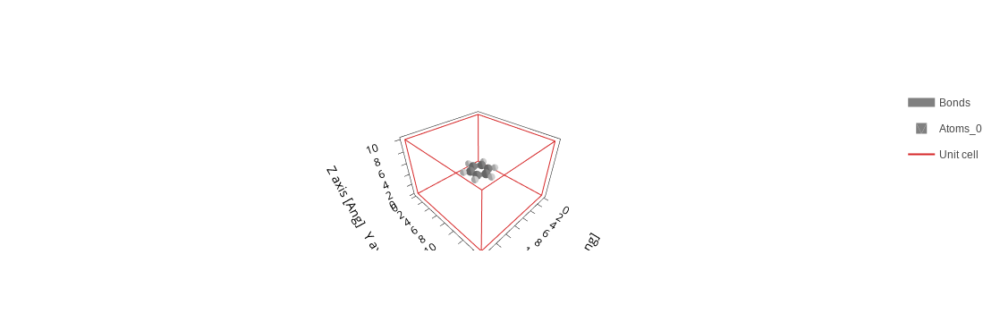

In [23]:
benzene=ase.build.molecule('C6H6', vacuum=5)
geometry=sisl.Geometry.new(benzene)
geometry.write('benze.fdf')
geometry.plot()

Abans d'executar el següent pas s'ha de generar el hamiltonià amb SIESTA a partir dels fitxers d'input: "benze.fdf", "C.psf" i "H.psf".

Un cop corregut el programa llegim el Hamiltonià amb "sisl.get_sile("benze.fdf").read_hamiltonian()" i calculem els eigenstates amb "Hamiltonian.eigenstate()" 

In [24]:
Hamiltonian=sisl.get_sile("benze.fdf").read_hamiltonian()
eigenstate=Hamiltonian.eigenstate()

En la següent línia de codi es calculen els vectors propis del Hamiltonià que corresponen al coeficients de la funció

In [25]:
eigenstate.state

array([[-1.09925713e-01, -1.19827740e-01, -7.05316328e-02, ...,
        -9.40630466e-03,  4.52347454e-14,  1.62604286e-02],
       [-1.05468443e-01, -2.07729764e-01, -3.65206681e-02, ...,
        -1.32996208e-03,  4.59602246e-14,  1.68417616e-02],
       [ 8.12859825e-06,  1.60103299e-05,  2.81518425e-06, ...,
         1.69382054e-02, -7.79484619e-14, -2.09514135e-02],
       ...,
       [-1.01930569e+01,  5.65075698e+00, -5.30174661e+00, ...,
        -4.42861412e-01, -1.80700029e-11,  7.66495053e-01],
       [ 3.68230551e+00, -1.60928037e+00,  8.60129318e-01, ...,
        -1.43037395e-01,  3.46062363e-12,  2.47810531e-01],
       [-4.56808623e-07,  3.58166820e-07, -1.09764247e-08, ...,
         8.01078190e-01,  8.34977094e-15,  4.62464331e-01]])

En la següent línia de codi es calculen els valors propis del Hamiltonià que corresponen als valors de l'energia de cada estat

In [26]:
eigenstate.eig

array([-16.85584921, -14.0856129 , -14.08561174, -10.53069213,
       -10.53054227,  -8.65691373,  -6.88636117,  -6.66710033,
        -5.94719358,  -5.94660128,  -4.7629345 ,  -3.947479  ,
        -3.9472216 ,  -2.0336825 ,  -2.0335716 ,   3.17039698,
         3.17043392,   6.11502598,   7.11138195,   7.63003778,
         7.63105022,   8.40580666,   8.40584601,   9.16184149,
        11.24458368,  11.24516225,  11.43573032,  11.43615096,
        11.82269438,  12.22032039,  12.44676789,  14.53391452,
        14.534041  ,  15.05254152,  15.05304262,  15.49873408,
        16.05283721,  16.05462092,  16.98877124,  17.24325958,
        17.47766281,  17.47772598,  18.04618741,  19.26995222,
        19.89849062,  21.96329687,  21.96476612,  22.06533538,
        22.06778255,  22.08878172,  22.08900384,  23.82259741,
        23.82262539,  24.69043576,  24.9404016 ,  24.94327857,
        25.9243249 ,  26.8633256 ,  26.8666338 ,  27.21287037,
        27.50885201,  28.22176221,  28.22599683,  29.59

Tot seguit es genera un gràfic de PDOS en funció de l'energia.
En aquest gràfic els estats amb energia per sota de 0eV (sota del nivell de Fermi) estan ocupats pels electrons mentre que els d'energia més alta són els que estan lliures. 

He separat els gràfics primer amb la contribució total dels electrons i després en funció de la contribució dels electrons de cada tipus d'àtom (C i H) i finalment en funció dels orbitals.

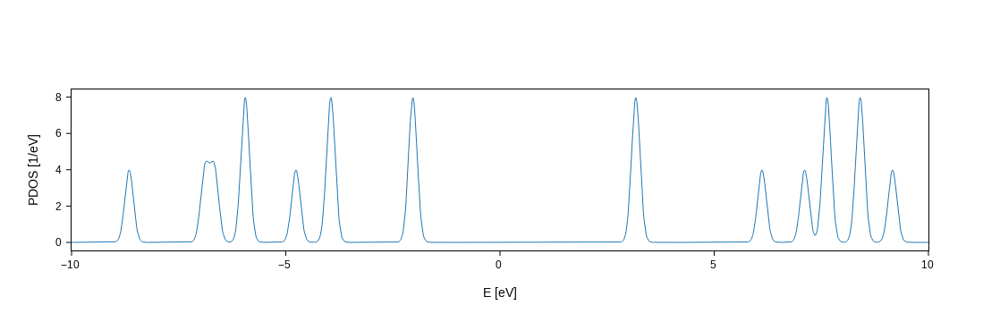

In [27]:
Hamiltonian.plot.pdos(data_Erange=[-10, 10], nE=1200, Erange=[-10, 10], kgrid=[1,1,1])

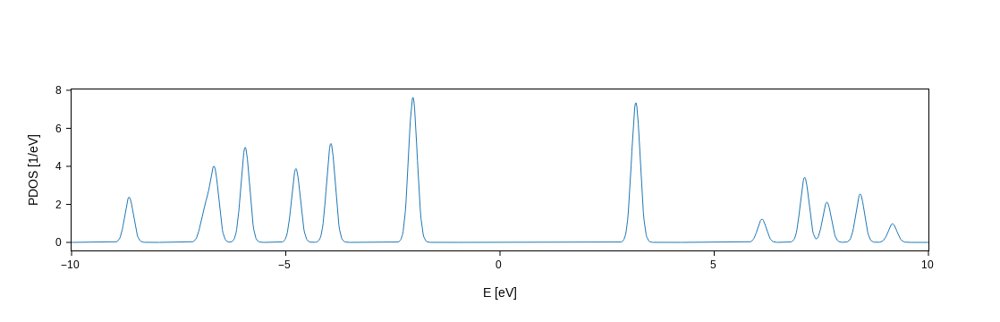

In [28]:
Hamiltonian.plot.pdos(data_Erange=[-10, 10], nE=1200, Erange=[-10, 10], kgrid=[1,1,1], groups=[{"species": "C"}])#.split_DOS(on="species+l+m")

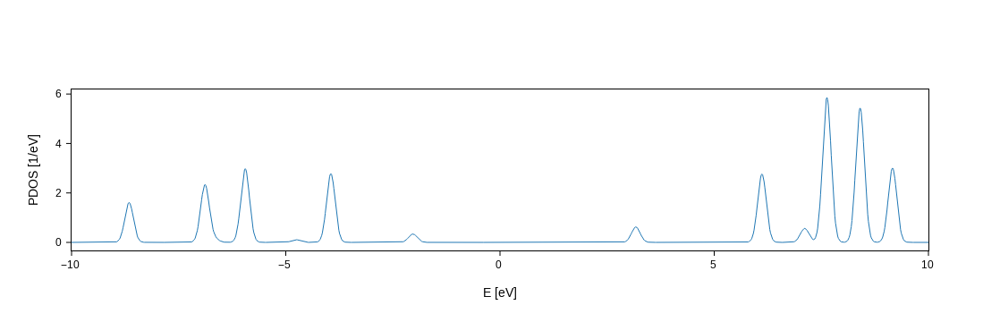

In [29]:
Hamiltonian.plot.pdos(data_Erange=[-10, 10], nE=1200, Erange=[-10, 10], kgrid=[1,1,1], groups=[{"species": "H"}])


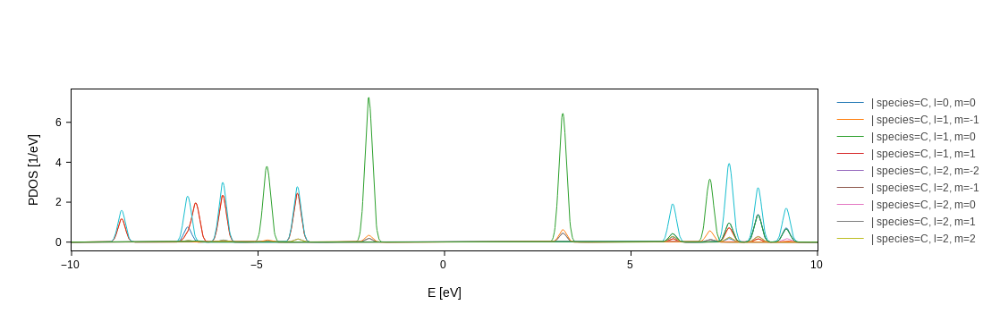

In [30]:
Hamiltonian.plot.pdos(data_Erange=[-10, 10], nE=1200, Erange=[-10, 10], kgrid=[1,1,1]).split_DOS(on="species+l+m")

En el següent bloc es defineixen les funcions que s'usaran per fer les imatges de STM:

STM_grid(H,V) es generen dos grid i es fa el programa per cada un dels estats que s'han calculat, tot seguit es mira en quin rang d'energies es vol treballar amb l'STM i en funció d'aquest s'excecuta una part del bucle o l'altre, es calcula la densitat de probabilitat i es suma al grid total. Aquest procès es va repetint per cada estat. Un cop calculades les densitats de probabilitat per cada estat i sumades al grid obtenim les densitats d'estats orbitals locals(LDOS)

plot_STM_images() fa que només es dongui la LDOS a una certa altura de la mostra. 

In [31]:

def STM_grid(H,V):

    grid=sisl.Grid((100, 100, 100), geometry=geometry)
    grid_temp=sisl.Grid((100, 100, 100), geometry=geometry)   
    grid.fill(0)
    for n in range(0,108):
        
        if 0<eigenstate[n].eig<V:
      
            grid_temp.fill(0)
            eigenstate[n].wavefunction(grid_temp)
            GT_n=grid_temp*grid_temp.grid.conj() 
            grid=grid+GT_n
        
        if V<eigenstate[n].eig<0:
      
            grid_temp.fill(0)
            eigenstate[n].wavefunction(grid_temp)
            GT_n=grid_temp*grid_temp.grid.conj()
            grid=grid+GT_n
            
        else:
            grid_temp.fill(0)
            GT_n=0
        

    return grid

In [32]:
grid=sisl.Grid((100, 100, 100), geometry=geometry)
def plot_STM_images(
    LDOS_grid: sisl.Grid, 
    min_height: int = 0, 
    max_height: int = 2,
    steps: int = 9,
    crange = None,
    colorscale: str = None
):
    """Plots constant height STM images at multiple heights

    Parameters
    ----------
    LDOS_grid:
        A grid containing the LDOS corresponding to the voltage that you
        want to plot, for ALL SPACE.
    min_height:
        The height of the first image.
    max_height:
        The height of the last image.
    steps:
        The number of steps between the first and the last image.
    log:
        Whether to plot the log of the values.
    crange:
        The range of the colorscale. E.g. [0, 2]. If None, it is computed
        from the minimum and maximum values of the data.
    colorscale:
        The plotly colorscale to use.

    Examples
    ----------

    This function should be used like:
    >>> grid = ...compute the LDOS in the grid.
    >>> plot_STM_images(grid)
    """
    
    # Determine all the heights that the user wants to plot
    heights = np.linspace(min_height, max_height, steps)
    # Get the position of the benzene molecule
    z_0 = grid.geometry.xyz[:, 2].max()
    
    # Initialize a list of plots
    plots = []
    coloraxes = []
    # Loop through the heights, and for each of them we will create a plot.
    for height in heights:
        # Get the z for which we want the LDOS (benzene position + height)
        z = z_0 + height
        
        # Get the plot for this height
        plot = LDOS_grid.plot(axes="xy", z_range=[z - 0.1, z + 0.1], crange=crange, colorscale=colorscale)

        # And append it to the list
        plots.append(plot)

    # Merge all the plots, with some extra arguments to beautify the plot.
    return sisl.viz.merge_plots(
        *plots, 
        composite_method="subplots", 
        arrange="square", 
        subplot_titles=[f"Height = {height} Ang" for height in heights],
        horizontal_spacing=0,
        vertical_spacing=0.05
    ).update_xaxes(
        visible=False
    ).update_yaxes(
        visible=False
    ).update_layout(
        height=900, title=f"Constant height STM images",
    )

Finalment excecutem les dos funcions per un potencial establert i obtenim els resultats de l'STM per diferents altures:

(Podem observar com a mesura que anem augmentant l'altura de la punta del STM no podem observar tanta contribució dels orbitals ja que no són prou intensos.podem veure les contribucions dels estats possibles en funció del rang d'energia de tots els carbonis i hidrogen)

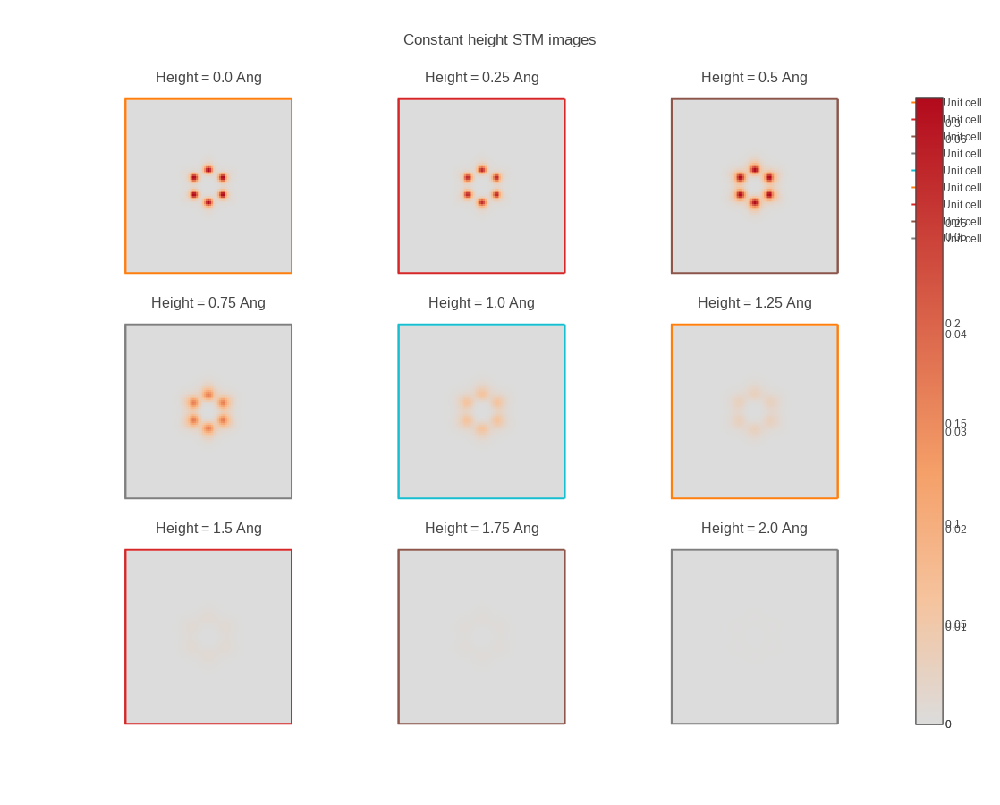

In [33]:
STM=STM_grid(Hamiltonian,4)
plot_STM_images(STM)  

En aquestes imatges de STM aplicant una diferencia de potencial de -4V. Aixó passa per la majoria excepte per l'altura de 0.5Ang on podem veure que la intensitat és major que en les altures menors. L'estat amb major contribució amb diferència és el de carboni l=1 m=0 (pz). Degut a aixó el que podem observar a la imatge es la posició dels àtoms de carboni del benzé. 

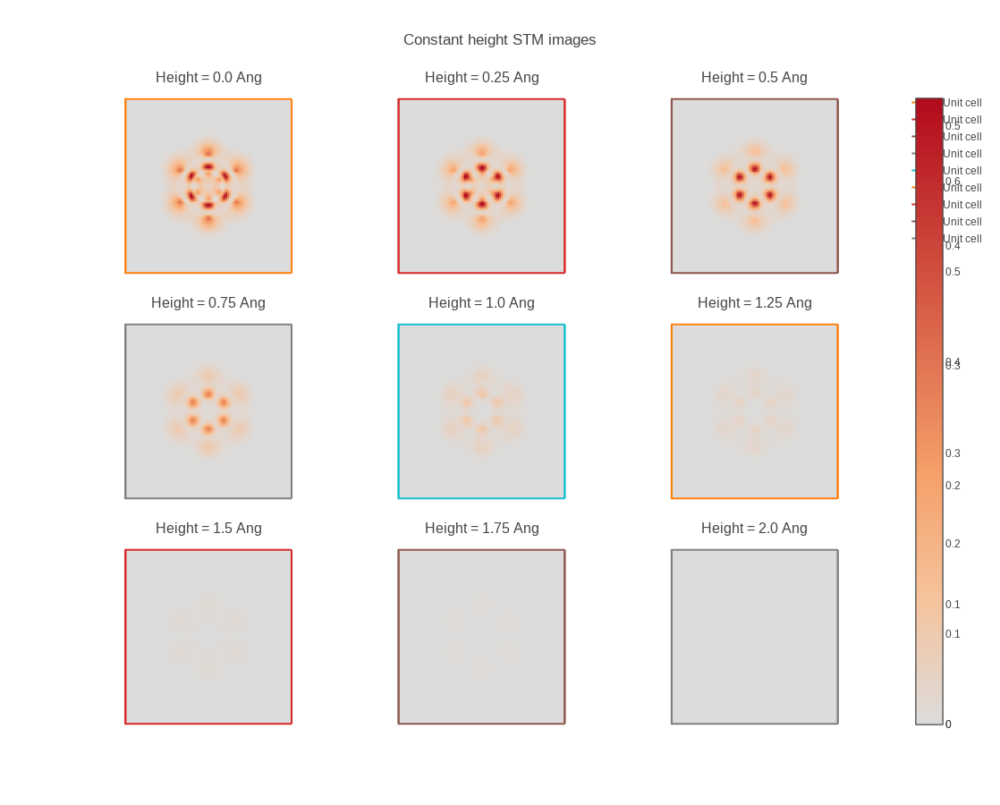

In [34]:
STM=STM_grid(Hamiltonian,10)
plot_STM_images(STM)

En aquestes imatges de STM aplicant una diferencia de potencial de -10V. En aquesta imatge es pot observar la contribució de tots els estats possibles del carboni i l'hidrogen pero els de major contribució són: el de carboni l=0 m=0(s), l=1 m=-1 (py), l=1 m=0(pz) i l=1 m=1(px); i el de l'hidrogen l=0 m=0 (s), tot i que la resta d'estats de l'atom d'hidrogen tenen una contribució rellevant. Degut a aixó podem observar la posició dels àtoms de carboni i d'hidrogen. 

A mesura que anem augmentat l'altura veiem com deixem de veure contribucions de certs estats menys energétics fins que arriba un punt que l'altura és prou alta com perquè els estats no es puguin veure ja que no són prou intens. 

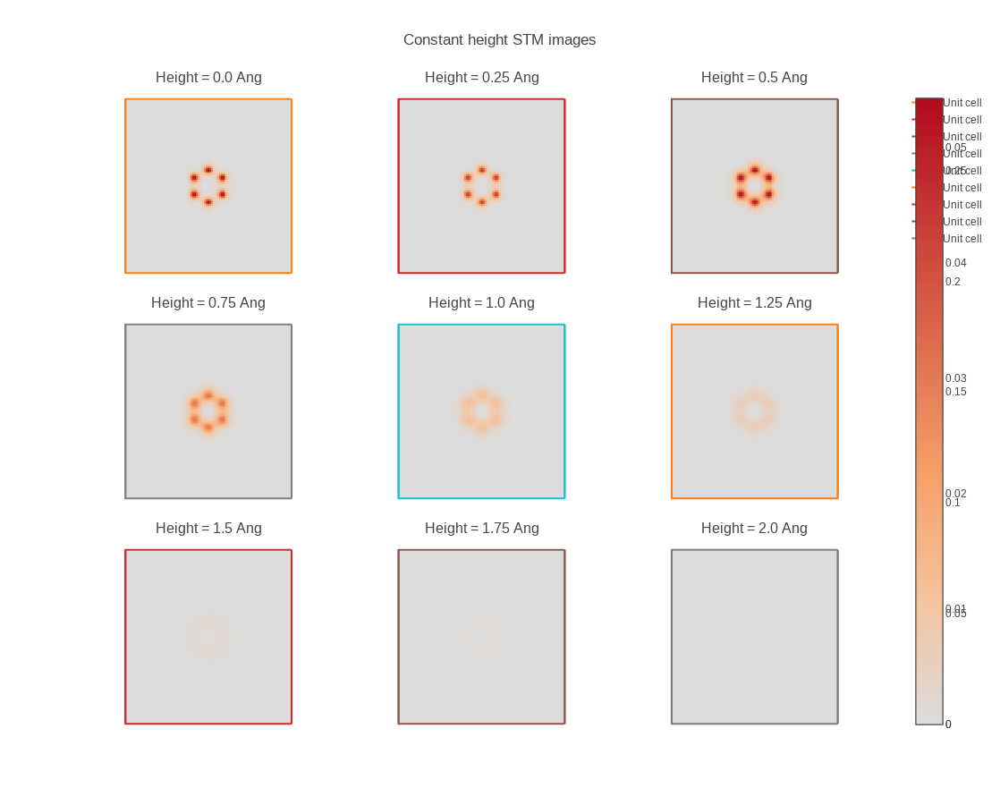

In [35]:
STM=STM_grid(Hamiltonian,-3)
plot_STM_images(STM)

En aquestes imatges de STM aplicant una diferencia de potencial de 3V. L'estat amb major contribució amb diferència és el de carboni l=1 m=0 (pz). Per tant podem observar els estats ocupats dels àtoms de carboni.

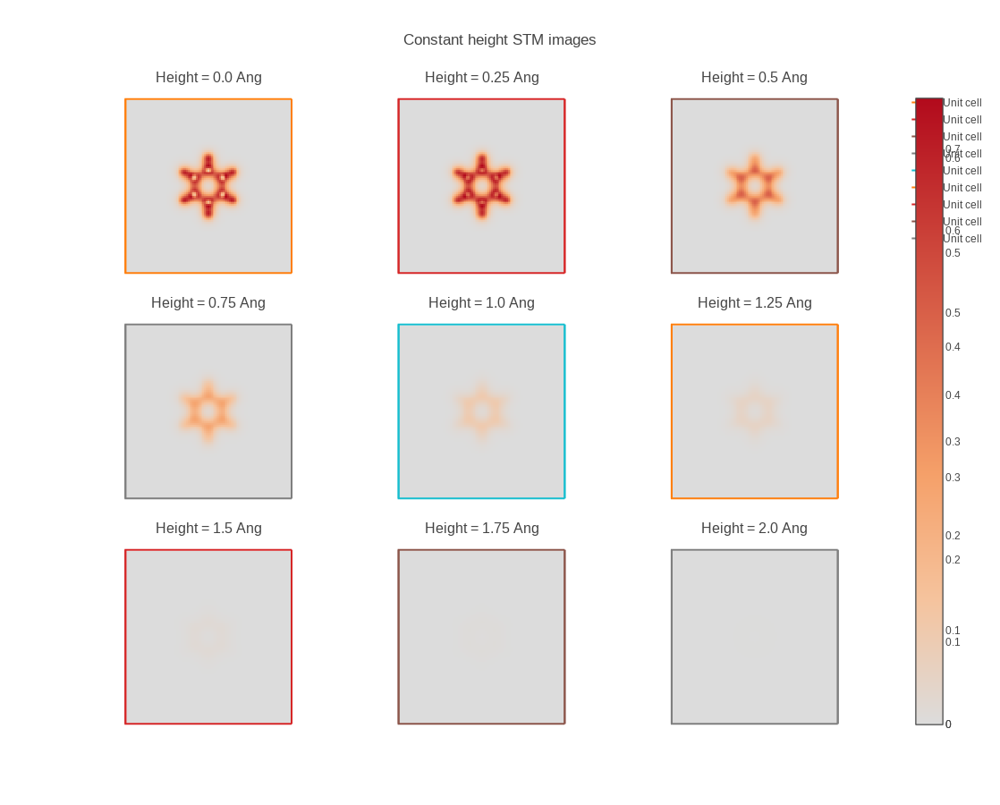

In [36]:
STM=STM_grid(Hamiltonian,-10)
plot_STM_images(STM)

En aquestes imatges de STM aplicant una diferencia de potencial de 10V.  En aquesta imatge es pot observar la contribució de tots els estats possibles ocupats del carboni i l'hidrogen però els de major contribució són: el de carboni l=1 m=-1 (py), l=1 m=0 (pz) i l=1 m=1 (px), tinguent una contribució prou rellevant de l'estat l=0 m=0 (s); i el de l'hidrogen l=0 m=0 (s). 

    BONUS: Si volguéssim veure la contribució a la imatge STM dels estats entre -9 i -4eV podríem fer la integral de la LDOS entre -9 i -4eV. Experimentalment, això no es pot aconseguir directament perquè una imatge a voltatge +/-V ens mostra les contribucions de 0 a -/+V eV. Imagineu que heu descobert una cosa molt interessant en un cert rang d'energies (e.g. [-9, -4]) i voleu que els vostres col·laboradors experimentals, que només tenen STM, ho comprobin. Què els hi podrieu dir que facin? Per què? Fent servir la estratègia que haurien de seguir els experimentals, mostreu la contribució d'algun rang d'energies que no acabi ni comenci en 0 eV en el benzè. Com abans, relacioneu el que veieu amb la PDOS.   



En aquest cas els hi comentaria que fessin un escombrat fins a 9V i un altre fins a 4V. Tot seguit haurien de restar les LDOS dels dos escanejos i obtindriem una imatge STM amb un rang d'energia de -9eV a -4eV.

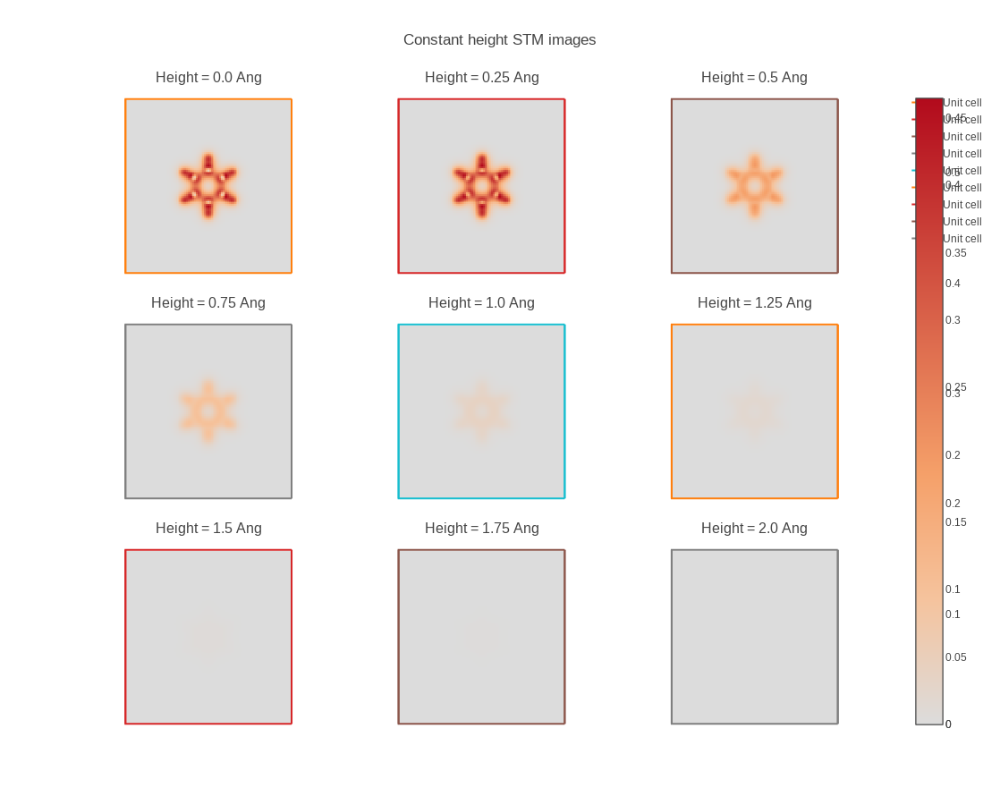

In [37]:
rang_STM=STM_grid(Hamiltonian,-9)-STM_grid(Hamiltonian,-4)
plot_STM_images(rang_STM)